In [6]:
import atomai as aoi
from atomai.nets import ConvBlock, UpsampleBlock
from atomai.utils import set_train_rng
import copy
import torch
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import cv2
import numpy as np
from scipy.signal import convolve2d
import random

In [7]:
imgdata = np.load("../../graphene_MD_imgs.npy")[::3] # take ~1/3 of the data
print(imgdata.shape)

(2016, 256, 256)


![image](image_from_paper/Real_ESRGAN.png)

In [8]:
def add_blur(image):
    section=random.randint(0,1)
    if(section):
        sigma=random.randint(5,9)
        kernel_size = 19
        # Generate a 2D Gaussian blur kernel
        blur_kernel = cv2.getGaussianKernel(kernel_size, sigma)
        # Create a 2D Gaussian blur filter
        gaussian_blur_filter = np.outer(blur_kernel, blur_kernel)
        # Normalize the kernel
        gaussian_blur_filter /= np.sum(gaussian_blur_filter)
        blurred_image = cv2.filter2D(image, -1, gaussian_blur_filter)
    else:
        # Define the length and angle of motion blur
        kernel_length = 19
        kernel_angle=random.randint(3,9)
        #kernel_angle = 9  # Angle in degrees
        # Create a motion blur kernel
        motion_blur_kernel = np.zeros((kernel_length, kernel_length))
        row, col = kernel_length // 2, kernel_length // 2
        motion_blur_kernel[row, :] = np.sin(np.deg2rad(kernel_angle))
        motion_blur_kernel[row, col] = np.cos(np.deg2rad(kernel_angle))
        motion_blur_kernel /= np.sum(motion_blur_kernel)
        blurred_image = convolve2d(image, motion_blur_kernel, mode='same')
    return blurred_image

   

In [9]:
import numpy as np
from scipy.ndimage import zoom
from PIL import Image
def resize(image,factor=0.25):
    image_array = image

    new_height = 300
    new_width = 400

    # Calculate the scaling factors for each dimension
    scale_factors = (
        new_height / image_array.shape[0],  # Height scaling factor
        new_width / image_array.shape[1]   # Width scaling factor
                                        # Depth or color channels scaling factor (1 for grayscale)
    )
    order=random.randint(1,4)
    # Resize the image using different interpolation methods
    resized_nearest = zoom(image_array, factor, order=0)
    resized_area = zoom(image_array, factor, order=3)
    resized_bilinear = zoom(image_array,factor, order=1)
    resized_bicubic = zoom(image_array, factor, order=2)
    if order==1:
        resize_image=resized_nearest
    elif order==2:
        resize_image=resized_area
    elif order==3:
        resize_image=resized_bilinear
    elif order==4:
        resize_image=resized_bicubic
    return resize_image


    
    

In [11]:
imgdata_noisy_resized = []
for i,image in enumerate (imgdata):
    blurred_image=add_blur(image)
    np.random.seed(42) # for reproducibility
    # Add noise to data
    resize_image=resize(blurred_image,factor=1)
    img_noisy = resize_image + np.random.normal(scale=8, size=resize_image.shape)
    #blurred_image=add_blur(imgdata_noisy)
    resize_image=resize(blurred_image,factor=0.6)
    # Add noise to data
    #img_noisy = resize_image + np.random.normal(scale=8, size=resize_image.shape)
    imgdata_noisy_resized.append(img_noisy)

In [6]:
imgdata_noisy_resized=np.array(imgdata_noisy_resized)

In [7]:
imgdata_noisy_resized.shape

(2016, 256, 256)

In [8]:
np.random.seed(5) # for reproducibility
# Add noise to data
imgdata_noisy = imgdata + np.random.normal(scale=8, size=imgdata.shape)

In [9]:
imgdata_noisy.shape

(2016, 256, 256)

NameError: name 'imgdata_noisy' is not defined

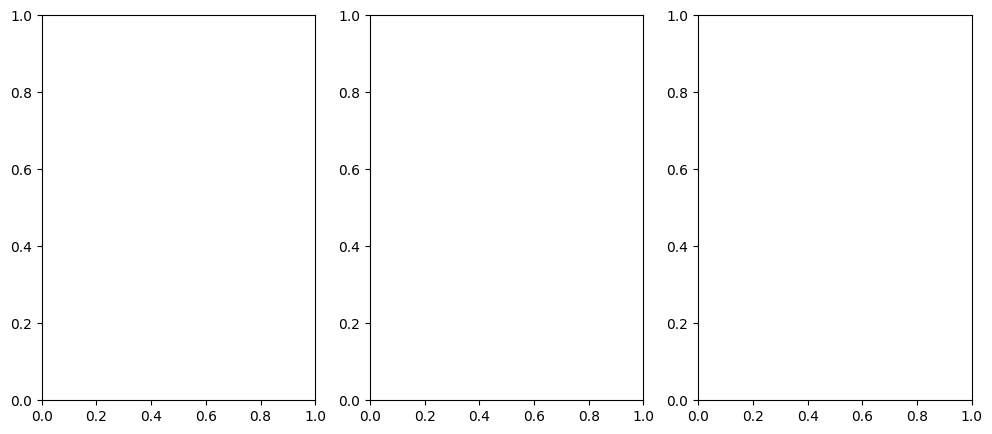

In [10]:
k = 85

_, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(12, 5))
ax1.imshow(imgdata_noisy[k])
ax2.imshow(imgdata[k])
ax3.imshow(imgdata_noisy_resized[k])
ax1.set_title("Corrupted image")
ax2.set_title("Original image")
ax3.set_title("New image")

In [11]:
(imgdata, imgdata_noisy,
 imgdata_test, imgdata_noisy_test)  = aoi.utils.data_split(
     imgdata, imgdata_noisy_resized, format_out="torch_float", channel="first")

In [12]:
import torch
import torch.nn as nn

# Define a residual block
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels)
            )

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        out += self.shortcut(x)
        out = self.relu(out)
        return out

# Define the Encoder-Decoder Residual Network
class EDRN(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(EDRN, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            ResidualBlock(64, 64),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(64, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, out_channels, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        enc = self.encoder(x)
        dec = self.decoder(enc)
        return dec

# Test with example sizes (adjust input and output channels as needed)
model = EDRN(in_channels=1, out_channels=1)
input_tensor = torch.randn(1, 1, 256, 256)  # Batch size 1, 1 channel, 256x256 input
output_tensor = model(input_tensor)
print(output_tensor.shape)  # Should print torch.Size([1, 1, 256, 256])

torch.Size([1, 1, 256, 256])


In [13]:
import torch.nn as nn

# Encoder
encoder = nn.Sequential(
    nn.Conv2d(1, 32, kernel_size=3, padding=1),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    nn.Conv2d(32, 64, kernel_size=3, padding=1),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    nn.Conv2d(64, 128, kernel_size=3, padding=1),
    nn.ReLU(),
    nn.MaxPool2d(2, 2)
)

# Decoder
decoder = nn.Sequential(
    nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.ReLU(),
    nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.ReLU(),
    nn.ConvTranspose2d(32, 1, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.Sigmoid()  # Sigmoid activation to constrain output to [0, 1]
)

# Complete DAE
dae = nn.Sequential(
    encoder,
    decoder
)

# Test with a random input
x = torch.randn(1713, 1, 256, 256)
output = dae (x)

print(output.shape)  # Should print torch.Size([1713, 1, 179, 179])

: 

In [14]:
torch_DAE=dae

In [15]:
trainer = aoi.trainers.BaseTrainer()
trainer.set_model(torch_DAE)
set_train_rng(1)
trainer._reset_weights()
trainer._reset_training_history()

trainer.compile_trainer(
    (imgdata_noisy, imgdata, imgdata_noisy_test, imgdata_test), # training data
    loss="mse", training_cycles=500, swa=True  # training parameters
)
trained_model = trainer.run()

RuntimeError: The size of tensor a (64) must match the size of tensor b (256) at non-singleton dimension 3

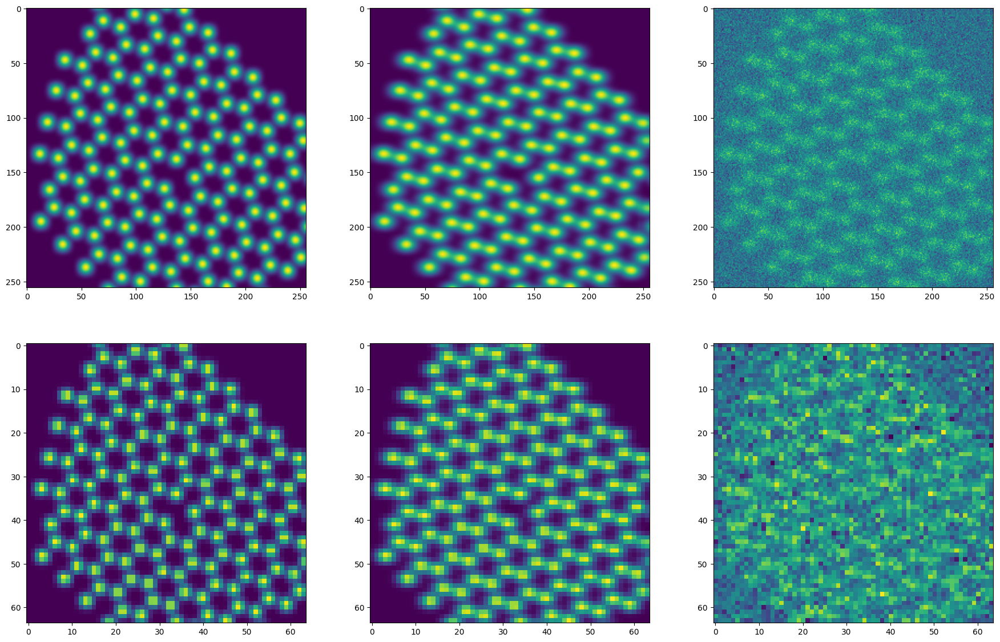

In [ ]:
fig,ax=plt.subplots(2,3,figsize=(22,14))
image=imgdata[0]
blurred_image=add_blur(image)
np.random.seed(2) # for reproducibility
# Add noise to data
imgdata_noisy = blurred_image + np.random.normal(scale=8, size=blurred_image.shape)
resize_original=resize(image,factor=0.25)
resize_blur=resize(blurred_image,factor=0.25)
resize_noise=resize(imgdata_noisy,factor=0.25)
ax[0][1].imshow(blurred_image)
ax[0][0].imshow(image)
ax[0][2].imshow(imgdata_noisy)
ax[1][0].imshow(resize_original)
ax[1][1].imshow(resize_blur)
ax[1][2].imshow(resize_noise)

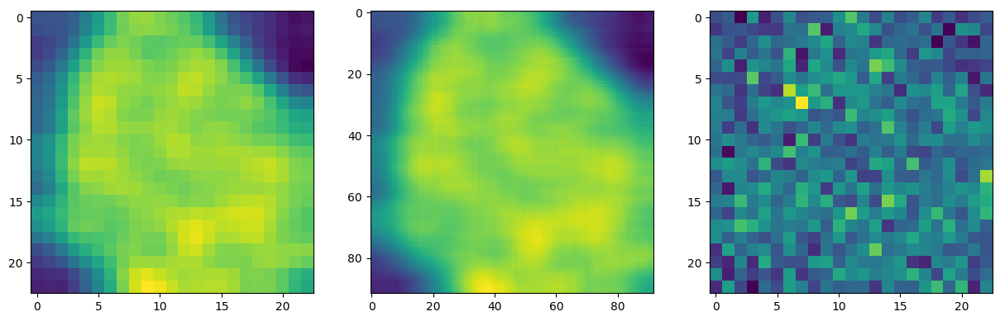

In [39]:


# second order
fig,ax=plt.subplots(1,3,figsize=(15,22))

blurred_image=add_blur(imgdata_noisy)
resize_image=resize(blurred_image,factor=0.25)
np.random.seed(2) # for reproducibility
# Add noise to data
imgdata_noisy = resize_image + np.random.normal(scale=8, size=resize_image.shape)
ax[1].imshow(blurred_image)
ax[0].imshow(resize_image)
ax[2].imshow(imgdata_noisy)

'\n# Convert NumPy arrays back to Pillow images\nresized_nearest_image = Image.fromarray(resized_nearest.astype(np.uint8))\nresized_area_image = Image.fromarray(resized_area.astype(np.uint8))\nresized_bilinear_image = Image.fromarray(resized_bilinear.astype(np.uint8))\nresized_bicubic_image = Image.fromarray(resized_bicubic.astype(np.uint8))\n\n# Display or save the resized images with different interpolation methods\nresized_nearest_image.show(title="Nearest-neighbor Interpolation")\nresized_area_image.show(title="Area-based Resampling")\nresized_bilinear_image.show(title="Bilinear Interpolation")\nresized_bicubic_image.show(title="Bicubic Interpolation")\n'

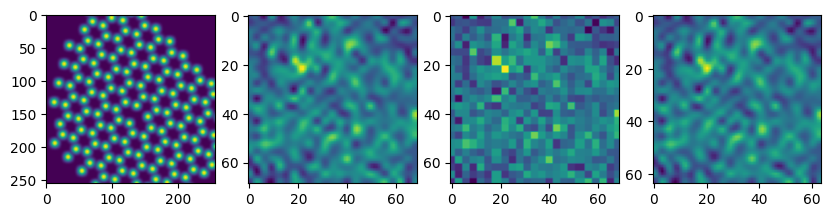

In [54]:
import numpy as np
from scipy.ndimage import zoom
from PIL import Image



# Convert the Pillow image to a NumPy array
image_array = imgdata_noisy

new_height = 64
new_width = 64

# Calculate the scaling factors for each dimension
scale_factors = (
    new_height / image_array.shape[0],  # Height scaling factor
    new_width / image_array.shape[1]   # Width scaling factor
                                     # Depth or color channels scaling factor (1 for grayscale)
)

# Resize the image using different interpolation methods
resized_nearest = zoom(image_array, 3, order=0)
resized_area = zoom(image_array, 3.0, order=2)
resized_bilinear = zoom(image_array,0.4, order=1)
resized_bicubic = zoom(image_array, scale_factors, order=3)
fig,ax=plt.subplots(1,4,figsize=(10,22))
ax[1].imshow(resized_area)
ax[0].imshow(image)
ax[2].imshow(resized_nearest)
ax[3].imshow(resized_bicubic)


"""
# Convert NumPy arrays back to Pillow images
resized_nearest_image = Image.fromarray(resized_nearest.astype(np.uint8))
resized_area_image = Image.fromarray(resized_area.astype(np.uint8))
resized_bilinear_image = Image.fromarray(resized_bilinear.astype(np.uint8))
resized_bicubic_image = Image.fromarray(resized_bicubic.astype(np.uint8))

# Display or save the resized images with different interpolation methods
resized_nearest_image.show(title="Nearest-neighbor Interpolation")
resized_area_image.show(title="Area-based Resampling")
resized_bilinear_image.show(title="Bilinear Interpolation")
resized_bicubic_image.show(title="Bicubic Interpolation")
"""






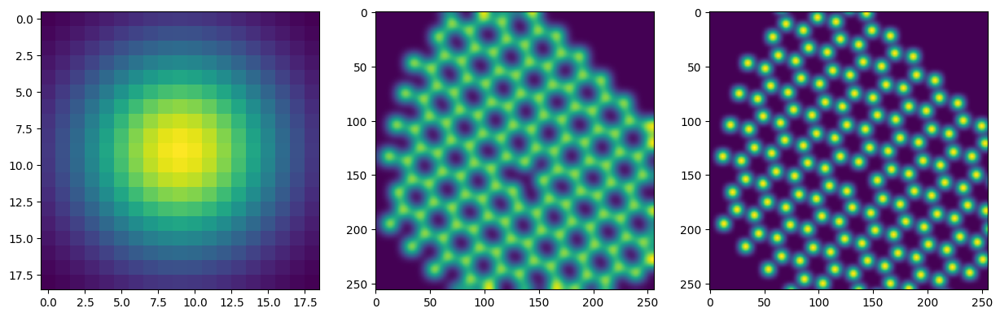

In [9]:
image=imgdata[0]
fig,ax=plt.subplots(1,3,figsize=(15,22))
# Define the kernel size (must be an odd number)
kernel_size = 19

# Generate a 2D Gaussian blur kernel
blur_kernel = cv2.getGaussianKernel(kernel_size, 5)

# Create a 2D Gaussian blur filter
gaussian_blur_filter = np.outer(blur_kernel, blur_kernel)

# Normalize the kernel
gaussian_blur_filter /= np.sum(gaussian_blur_filter)
ax[0].imshow(gaussian_blur_filter)
blurred_image = cv2.filter2D(image, -1, gaussian_blur_filter)
ax[1].imshow(blurred_image)
ax[2].imshow(image)

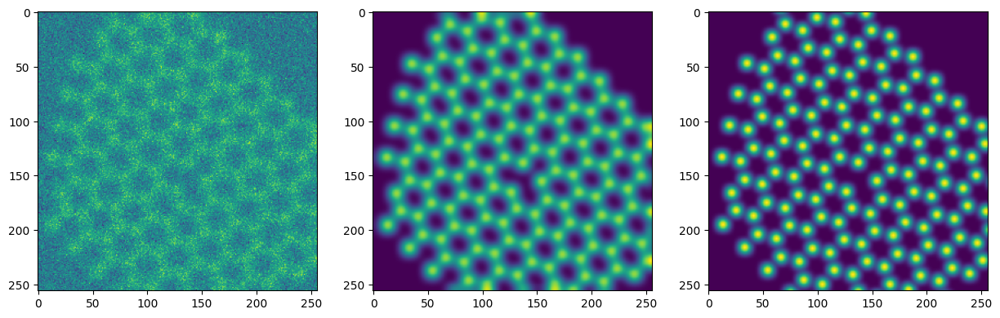

In [10]:
fig,ax=plt.subplots(1,3,figsize=(15,22))
# Define the kernel size (must be an odd number)


kernel_size = 12

# Create a box blur kernel
blur_kernel = np.ones((kernel_size, kernel_size), dtype=np.float32) / (kernel_size ** 2)
ax[0].imshow(blur_kernel)
blurred_image = cv2.filter2D(image, -1, blur_kernel)

np.random.seed(42) # for reproducibility
# Add noise to data
imgdata_noisy = blurred_image + np.random.normal(scale=8, size=blurred_image.shape)
ax[0].imshow(imgdata_noisy)
ax[1].imshow(blurred_image)
ax[2].imshow(image)

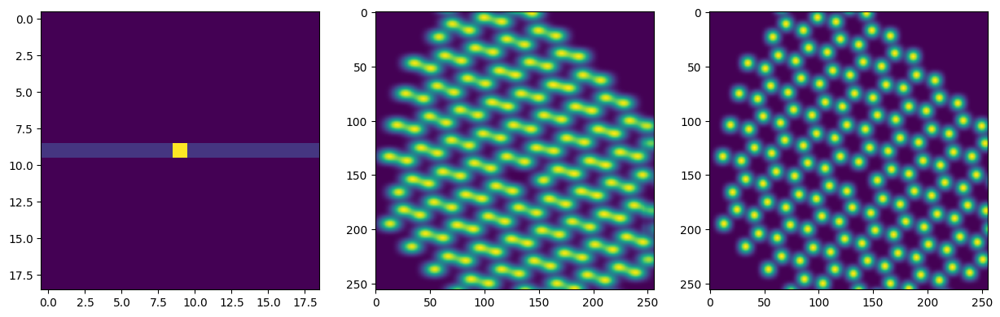

In [11]:
fig,ax=plt.subplots(1,3,figsize=(15,22))
# Define the kernel size (must be an odd number)


# Define the length and angle of motion blur
kernel_length = 19
kernel_angle = 9  # Angle in degrees

# Create a motion blur kernel
motion_blur_kernel = np.zeros((kernel_length, kernel_length))
row, col = kernel_length // 2, kernel_length // 2
motion_blur_kernel[row, :] = np.sin(np.deg2rad(kernel_angle))
motion_blur_kernel[row, col] = np.cos(np.deg2rad(kernel_angle))
motion_blur_kernel /= np.sum(motion_blur_kernel)
ax[0].imshow(motion_blur_kernel)
blurred_image = convolve2d(image, motion_blur_kernel, mode='same')

ax[1].imshow(blurred_image)
ax[2].imshow(image)

In [12]:
imgdata_noisy_new = []
for i,image in enumerate (imgdata):
    blurred_image=add_blur(image)
    np.random.seed(42) # for reproducibility
    # Add noise to data
    resize_image=resize(blurred_image,factor=0.25)
    img_noisy = resize_image + np.random.normal(scale=8, size=resize_image.shape)
    #blurred_image=add_blur(imgdata_noisy)
    resize_image=resize(blurred_image,factor=0.6)
    # Add noise to data
    #img_noisy = resize_image + np.random.normal(scale=8, size=resize_image.shape)
    imgdata_noisy_new.append(img_noisy)

In [13]:
import torch
import torch.nn as nn

# Define a residual block
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels)
            )

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        out += self.shortcut(x)
        out = self.relu(out)
        return out

# Define the Encoder-Decoder Residual Network
class EDRN(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(EDRN, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            ResidualBlock(64, 64),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(64, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, out_channels, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        enc = self.encoder(x)
        dec = self.decoder(enc)
        return dec

# Test with example sizes (adjust input and output channels as needed)
model = EDRN(in_channels=1, out_channels=1)
input_tensor = torch.randn(1, 1, 256, 256)  # Batch size 1, 1 channel, 256x256 input
output_tensor = model(input_tensor)
print(output_tensor.shape)  # Should print torch.Size([1, 1, 256, 256])


torch.Size([1, 1, 256, 256])


In [31]:
imgdata_noisy_new=np.array(imgdata_noisy_new)

In [32]:
imgdata_noisy_new.shape

(2016, 179, 179)

In [33]:

def add_noise():
    pass

In [41]:
np.random.seed(5) # for reproducibility
# Add noise to data
imgdata_noisy = imgdata + np.random.normal(scale=8, size=imgdata.shape)


Text(0.5, 1.0, 'send order image')

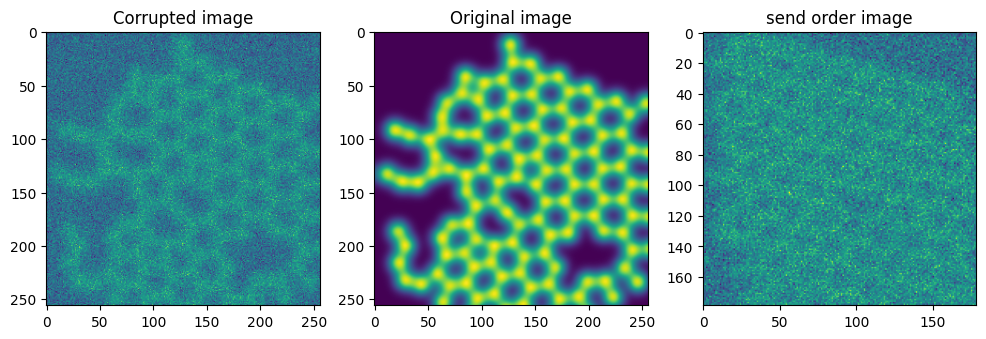

In [42]:
k = 15

_, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(12, 5))
ax1.imshow(imgdata_noisy[k][0])
ax2.imshow(imgdata[k][0])
ax3.imshow(imgdata_noisy_new[k])
ax1.set_title("Corrupted image")
ax2.set_title("Original image")
ax3.set_title("send order image")

In [16]:
(imgdata, imgdata_noisy,
 imgdata_test, imgdata_noisy_test)  = aoi.utils.data_split(
     imgdata, imgdata_noisy_new, format_out="torch_float", channel="first")

In [17]:
imgdata.shape

torch.Size([1713, 1, 256, 256])

In [18]:
imgdata_noisy.shape

torch.Size([1713, 1, 179, 179])

In [43]:
import torch.nn as nn

In [44]:
c=nn.Conv2d(1, 32, kernel_size=4, stride=2, padding=1)
c.weight.shape

torch.Size([32, 1, 4, 4])

In [14]:


# Encoder
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU()
        )

    def forward(self, x):
        return self.encoder(x)

# Decoder
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()  # Sigmoid activation to constrain output to [0, 1]
        )

    def forward(self, x):
        return self.decoder(x)

# Denoising Autoencoder
class DenoisingAutoencoder(nn.Module):
    def __init__(self):
        super(DenoisingAutoencoder, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Create an instance of the DenoisingAutoencoder
dae = DenoisingAutoencoder()
torch_DAE= DenoisingAutoencoder()

In [15]:
import torch.nn as nn

# Encoder
encoder = nn.Sequential(
    nn.Conv2d(1, 32, kernel_size=3, padding=1),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    nn.Conv2d(32, 64, kernel_size=3, padding=1),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    nn.Conv2d(64, 128, kernel_size=3, padding=1),
    nn.ReLU(),
    nn.MaxPool2d(2, 2)
)

# Decoder
decoder = nn.Sequential(
    nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.ReLU(),
    nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.ReLU(),
    nn.ConvTranspose2d(32, 1, kernel_size=3, stride=2, padding=1, output_padding=1),
    nn.Sigmoid()  # Sigmoid activation to constrain output to [0, 1]
)

# Complete DAE
dae = nn.Sequential(
    encoder,
    decoder
)

# Test with a random input
x = torch.randn(1713, 1, 256, 256)
output = dae (x)
print(output.shape)  # Should print torch.Size([1713, 1, 179, 179])

torch.Size([1713, 1, 256, 256])


In [21]:
torch_DAE=dae

In [279]:


import torch.nn as nn

# Define the encoder
encoder = nn.Sequential(
    nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, stride=1, padding=1),
    nn.ReLU(),
    nn.MaxPool2d(kernel_size=2, stride=2),
    nn.Conv2d(64, 128, 3, 1, 1),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
    nn.Conv2d(128, 256, 3, 1, 1),
    nn.ReLU(),
    nn.MaxPool2d(2, 2),
)

# Define the decoder
decoder = nn.Sequential(
    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # Upsample to 128x128
    nn.ReLU(),
    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # Upsample to 256x256
    nn.ReLU(),
    nn.Conv2d(64, 1, kernel_size=3, stride=1, padding=1),  # Output layer, 1 channel
    nn.Sigmoid()  # Use Sigmoid activation to ensure pixel values are in [0, 1] range
)

# Define the complete DAE
dae = nn.Sequential(encoder, decoder)

torch_DAE  = torch.nn.Sequential(encoder, decoder)

In [241]:
encoder = torch.nn.Sequential(
    torch.nn.Conv2d(in_channels=176, out_channels=128, kernel_size=3, stride=1, padding=1),
    torch.nn.ReLU(),
    torch.nn.MaxPool2d(kernel_size=2, stride=2),
    torch.nn.Conv2d(128, 64, 3, 1, 1),
    torch.nn.ReLU(),
    torch.nn.MaxPool2d(2, 2),
    torch.nn.Conv2d(64, 32, 3, 1, 1),
    torch.nn.ReLU(),
    torch.nn.MaxPool2d(2, 2),
    torch.nn.Conv2d(32, 16, 3, 1, 1),
    torch.nn.ReLU(),
)

# Define the decoder
decoder = torch.nn.Sequential(
    torch.nn.ConvTranspose2d(16, 32, 3, 2, 1, 1),
    torch.nn.ReLU(),
    torch.nn.ConvTranspose2d(32, 64, 3, 2, 1, 1),
    torch.nn.ReLU(),
    torch.nn.ConvTranspose2d(64, 128, 3, 2, 1, 1),
    torch.nn.ReLU(),
    torch.nn.ConvTranspose2d(128, 176, 3, 1, 1),
)

# Define the complete DAE
torch_DAE  = torch.nn.Sequential(encoder, decoder)

In [237]:

torch_encoder = torch.nn.Sequential(
    ConvBlock(ndim=2, nb_layers=1, input_channels=1, output_channels=8, batch_norm=True),
    torch.nn.MaxPool2d(2, 2),
    ConvBlock(2, 2, 8, 16, batch_norm=False),
    torch.nn.MaxPool2d(2, 2),
    ConvBlock(2, 2, 16, 32, batch_norm=False),
    torch.nn.MaxPool2d(2, 2),
    ConvBlock(2, 2, 32, 64, batch_norm=False)  # technically, this is a "bottleneck layer"
)

torch_decoder = torch.nn.Sequential(
    UpsampleBlock(ndim=2, input_channels=64, output_channels=64, mode="nearest"), # bilinear mode is better but leads to uncontrolled randomness on CPU
    ConvBlock(2, 2, 64, 32, batch_norm=False),
    UpsampleBlock(2, 32, 32, mode="nearest"),  # we can also use it to reduce numbe of "channels"
    ConvBlock(2, 2, 32, 16, batch_norm=False),
    UpsampleBlock(2, 16, 16, mode="nearest"),
    ConvBlock(2, 1, 16, 8, batch_norm=False),
    torch.nn.Conv2d(8, 1, 1) # vanilla 2D convolutional layer without activation
)

torch_DAE = torch.nn.Sequential(torch_encoder, torch_decoder)

In [16]:
trainer = aoi.trainers.BaseTrainer()
trainer.set_model(torch_DAE)

In [17]:
set_train_rng(1)
trainer._reset_weights()
trainer._reset_training_history()

trainer.compile_trainer(
    (imgdata_noisy, imgdata, imgdata_noisy_test, imgdata_test), # training data
    loss="mse", training_cycles=500, swa=True  # training parameters
)

NameError: name 'imgdata_noisy_test' is not defined

In [24]:
trained_model = trainer.run()

RuntimeError: The size of tensor a (176) must match the size of tensor b (256) at non-singleton dimension 3

TypeError: Invalid shape (256,) for image data

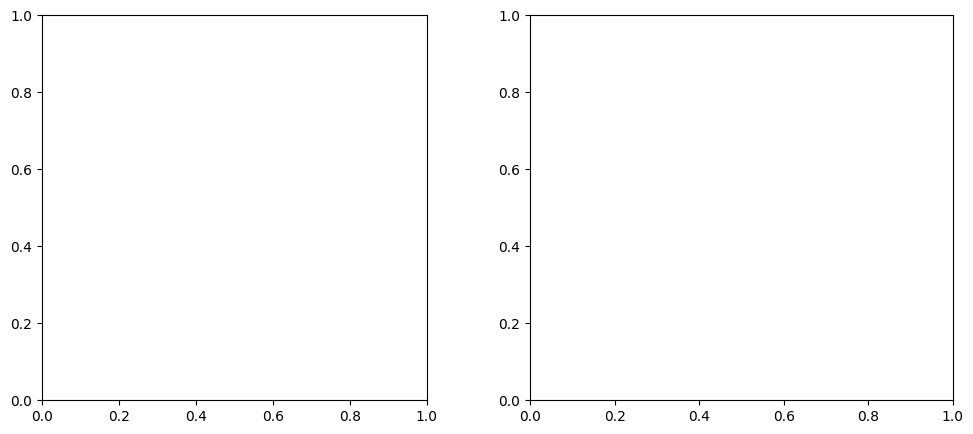

In [19]:
k = 15

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(imgdata_noisy[k])
ax2.imshow(imgdata[k])
ax1.set_title("Corrupted image")
ax2.set_title("Original image")

In [18]:
(imgdata, imgdata_noisy,
 imgdata_test, imgdata_noisy_test)  = aoi.utils.data_split(
     imgdata, imgdata_noisy, format_out="torch_float", channel="first")

ValueError: Found input variables with inconsistent numbers of samples: [2016, 256]

In [8]:

torch_encoder = torch.nn.Sequential(
    ConvBlock(ndim=2, nb_layers=1, input_channels=1, output_channels=8, batch_norm=True),
    torch.nn.MaxPool2d(2, 2),
    ConvBlock(2, 2, 8, 16, batch_norm=False),
    torch.nn.MaxPool2d(2, 2),
    ConvBlock(2, 2, 16, 32, batch_norm=False),
    torch.nn.MaxPool2d(2, 2),
    ConvBlock(2, 2, 32, 64, batch_norm=False)  # technically, this is a "bottleneck layer"
)

torch_decoder = torch.nn.Sequential(
    UpsampleBlock(ndim=2, input_channels=64, output_channels=64, mode="nearest"), # bilinear mode is better but leads to uncontrolled randomness on CPU
    ConvBlock(2, 2, 64, 32, batch_norm=False),
    UpsampleBlock(2, 32, 32, mode="nearest"),  # we can also use it to reduce numbe of "channels"
    ConvBlock(2, 2, 32, 16, batch_norm=False),
    UpsampleBlock(2, 16, 16, mode="nearest"),
    ConvBlock(2, 1, 16, 8, batch_norm=False),
    torch.nn.Conv2d(8, 1, 1) # vanilla 2D convolutional layer without activation
)

torch_DAE = torch.nn.Sequential(torch_encoder, torch_decoder)

In [9]:
trainer = aoi.trainers.BaseTrainer()
trainer.set_model(torch_DAE)

In [10]:
set_train_rng(1)
trainer._reset_weights()
trainer._reset_training_history()

trainer.compile_trainer(
    (imgdata_noisy, imgdata, imgdata_noisy_test, imgdata_test), # training data
    loss="mse", training_cycles=500, swa=True  # training parameters
)

Epoch 1/500 ... Training loss: 68.7291 ... Test loss: 65.7149 ... GPU memory usage: N/A / N/A
Epoch 100/500 ... Training loss: 1.8713 ... Test loss: 2.1159 ... GPU memory usage: N/A / N/A
Epoch 200/500 ... Training loss: 2.1563 ... Test loss: 1.1432 ... GPU memory usage: N/A / N/A
Epoch 300/500 ... Training loss: 1.183 ... Test loss: 0.919 ... GPU memory usage: N/A / N/A
Epoch 400/500 ... Training loss: 0.7043 ... Test loss: 0.727 ... GPU memory usage: N/A / N/A
Epoch 500/500 ... Training loss: 2.1271 ... Test loss: 1.9768 ... GPU memory usage: N/A / N/A
Model (final state) evaluation loss: 1.9894
Performing stochastic weight averaging...
Model (final state) evaluation loss: 0.6365
Plotting training history


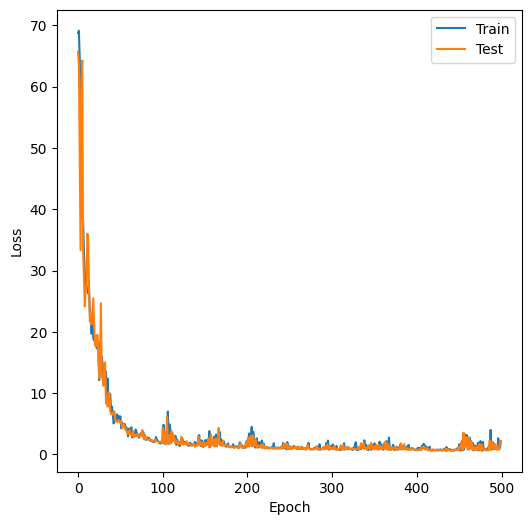

In [11]:
trained_model = trainer.run()

In [12]:
p = aoi.predictors.BasePredictor(trained_model, use_gpu=True)
prediction = p.predict(imgdata_noisy_test)

Text(0.5, 1.0, 'Difference')

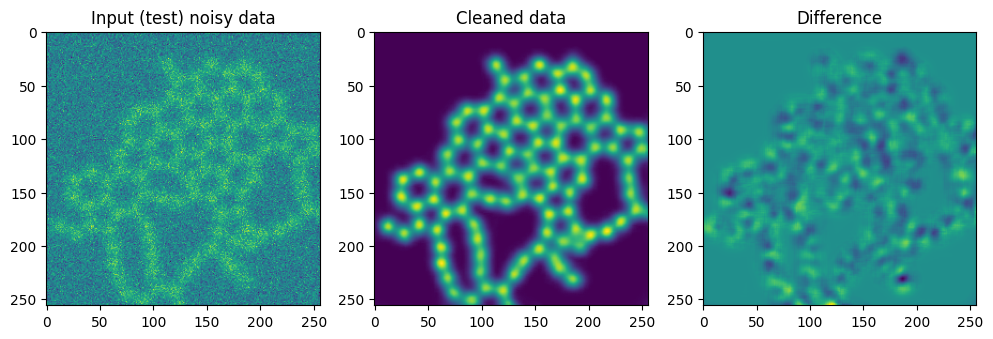

In [13]:

k = 50
# plot results
_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 5))
ax1.imshow(imgdata_noisy_test[k,0].cpu())
ax2.imshow(prediction[k,0].cpu())
ax3.imshow(imgdata_test[k,0].cpu() - prediction[k,0].cpu())
ax1.set_title("Input (test) noisy data")
ax2.set_title("Cleaned data")
ax3.set_title("Difference")

In [ ]:
img = imgdata_test[k:k+1]
for s in range(0, 100, 5):
    img = img + np.random.normal(scale=8+s, size=img.shape).astype(np.float32)
    prediction = p.predict(img)
    _, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    ax1.imshow(img[0,0].cpu())
    ax2.imshow(prediction[0,0].cpu())
    ax1.set_title("Input noisy data")
    ax2.set_title("Cleaned data")
    plt.show()

In [14]:
expdata = np.load("../../graphene_exp.npy")
expdata = expdata * 60 # scale it to the range of pixel values used in training data

In [15]:
expdata.shape

(1024, 1024)

In [16]:
expdata.max()

59.992676

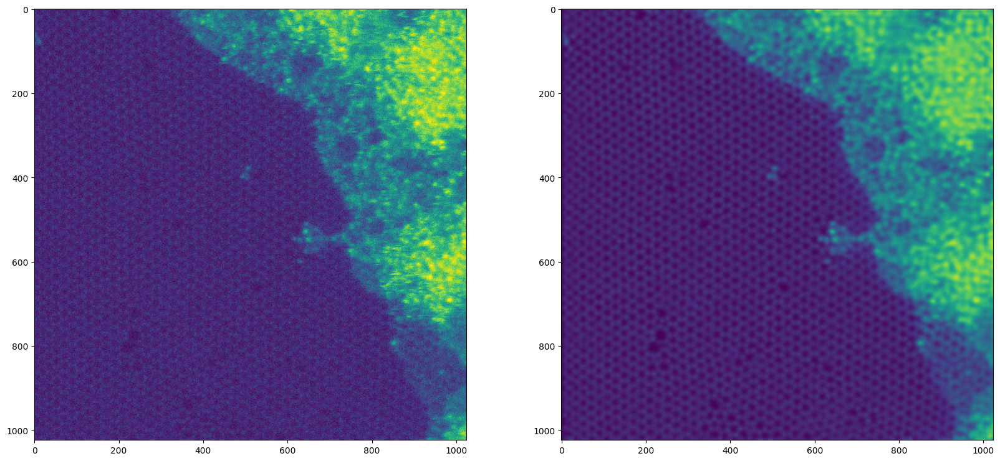

In [17]:
pred = p.predict(expdata[None, None])

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
ax1.imshow(expdata)
ax2.imshow(pred.squeeze())

In [18]:
from os.path import join
import pySPM
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from scipy.ndimage import gaussian_filter
from scipy.fft import fftshift, fft2,ifftshift,ifft2,fft,fftfreq
from scipy.signal import hann
from sklearn import preprocessing as pre
from skimage import filters

In [20]:
def my_FFT(img):
    x_p=img.shape[0]
    image_bw=(img-img.min())/(img.max()-img.min())
    image_bw=img
    image_norm=pre.MinMaxScaler().fit_transform(img)
    window_hann = image_bw * hann(x_p, sym=True)
    ft = np.fft.fftshift(np.fft.fft2(window_hann))
    power_spectrum = np.abs(ft) ** 2
    return (power_spectrum-power_spectrum.min())/(power_spectrum.max()-power_spectrum.min())
def display_topo(image,fig,ax,x_n,y_n,title="SiC",scalecolor="white",scalesize=0.3,cmap="Blues_r"):
    #image=gaussian_filter(image,sigma=1)
    Z_image= pySPM.SPM_image(image)
    #Z_image.correct_median_diff()
    #Z_image.correct_lines()
    (y_p,x_p)=image.shape
    Z_image.size["real"]["x"],Z_image.size["real"]["y"]=x_n*1e-9,y_n*1e-9
    Z_image.size["pixels"]["y"],Z_image.size["pixels"]["x"]=y_p,x_p
    img=Z_image.show(ax=ax,sig=None,cmap=cmap)
    ax.axis ('off')
    Vmin=np.ndarray.min(Z_image.pixels) 
    Vmax=np.ndarray.max(Z_image.pixels) 
    cb=fig.colorbar(img,ax=ax,orientation="vertical",pad=0.02,shrink=0.8) 
    cb.ax.yaxis.set_tick_params(size=0.8,labeltop=True) 
    cb.set_ticks([Vmax,Vmin])
    cb.set_ticklabels(["High","Low"])
    scale=int(x_n/10) 
    scalebar=AnchoredSizeBar(ax.transData,scale*2,"{0} nm".format(scale*2),"lower right",pad=1,sep=3,color=scalecolor,label_top=True,frameon=False,size_vertical=scalesize)
    #ax.add_artist(scalebar)
    ax.set_title(title) 
    return img

def read_file(filePath):
    SXMfile=pySPM.SXM(filePath)
    header=SXMfile.header
    Bias=header['BIAS'][0][0]
    Curr=header['Z-CONTROLLER'][1][3]
    Z_image=SXMfile.get_channel('Z')
    #Z_image.correct_median_diff()
    Z_image.correct_lines()
    x_n,y_n=Z_image.size["real"]["x"]*1e9,Z_image.size["real"]["y"]*1e9
    y_p,x_p=Z_image.size["pixels"]["y"],Z_image.size["pixels"]["x"]
    print("the file is {0},\r\nthe Bias is {1} V,the current is {4} A, the size is {2}*{2} nm,the resolution is {3}*{3} pix ".format(filePath,float(Bias),int(x_n),x_p,Curr))
    return Z_image,x_n

the file is ../../../STMdata/20221206/SiC038.sxm,
the Bias is -0.18 V,the current is 8.000E-11 A, the size is 5*5 nm,the resolution is 512*512 pix 


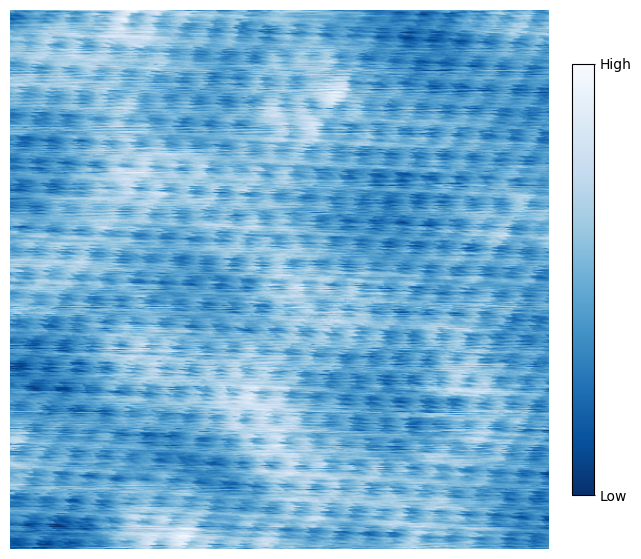

In [21]:
mydir,myFolder,fileName="../../../STMdata","20221206","SiC038.sxm"
filePath=join(mydir,myFolder,fileName)
Z_image,x_n=read_file(filePath)
y_n=x_n
image=Z_image.pixels[::-1,::]
x_p,y_p=image.shape[0],image.shape[1]
zoomFactor=0.12
zoomValue=int(x_p*zoomFactor)
fig,ax = plt.subplots(1,1,figsize=(15,7))
FFT_bw=my_FFT(image)
image=(image-image.min())/(image.max()-image.min())
LargeProfile=display_topo(image,fig,ax,x_n,y_n,title="",scalecolor="white",scalesize=0.15,cmap="Blues_r")

In [22]:
type(image)
expdata=image
expdata = expdata * 60 

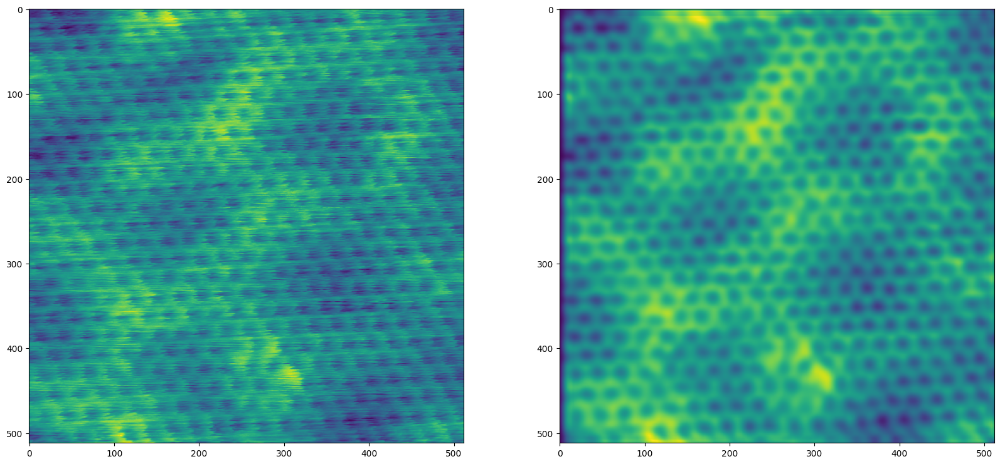

In [23]:
pred = p.predict(expdata[None, None])

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
ax1.imshow(expdata)
ax2.imshow(pred.squeeze())

the file is ../../../STMdata/20221207/SiC011.sxm,
the Bias is -0.2 V,the current is 8.000E-11 A, the size is 20*20 nm,the resolution is 256*256 pix 


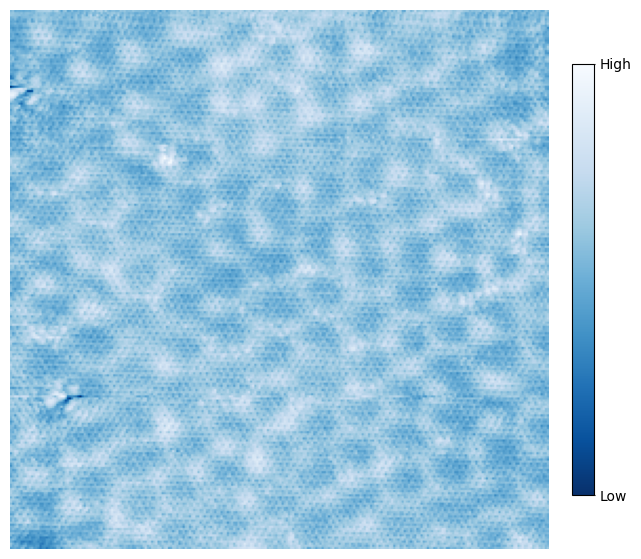

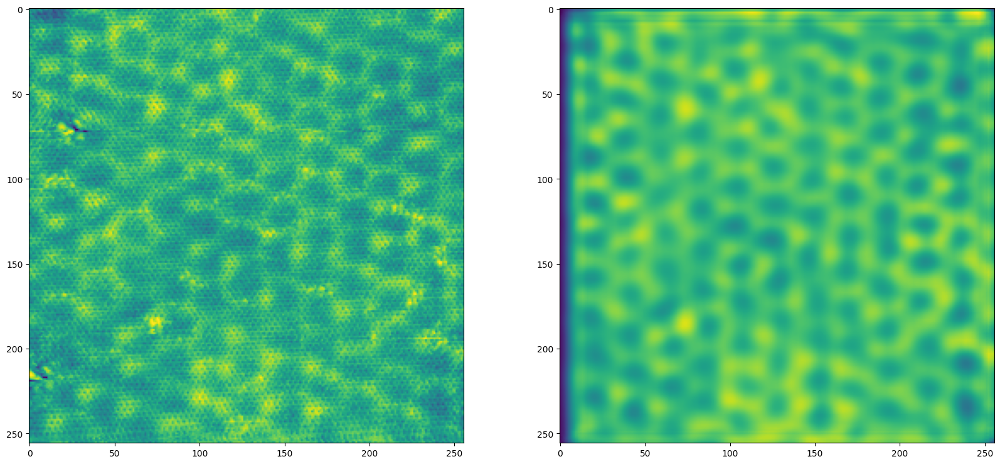

In [24]:
mydir,myFolder,fileName="../../../STMdata","20221207","SiC011.sxm"
filePath=join(mydir,myFolder,fileName)
Z_image,x_n=read_file(filePath)
y_n=x_n
image=Z_image.pixels[::-1,::]
x_p,y_p=image.shape[0],image.shape[1]
zoomFactor=0.12
zoomValue=int(x_p*zoomFactor)
fig,ax = plt.subplots(1,1,figsize=(15,7))
FFT_bw=my_FFT(image)
image=(image-image.min())/(image.max()-image.min())
LargeProfile=display_topo(image,fig,ax,x_n,y_n,title="",scalecolor="white",scalesize=0.15,cmap="Blues_r")


image_sig=copy.deepcopy(image)
image_sig[image_sig>0.9]=0.9
image_sig[image_sig<0.1]=0.1


type(image)
expdata=image_sig
expdata = expdata * 42

pred = p.predict(expdata[None, None])

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
ax1.imshow(expdata)
ax2.imshow(pred.squeeze())